# Workflow

## Import statements & function definitions

In addition to geopy and folium, we're going to import a few more packages:
* [geopandas](https://geopandas.org/) is a geospatial extension to pandas.
* [branca](https://pypi.org/project/branca/) module to help us create some simple choropleth maps.
* [ipywidgets](https://ipywidgets.readthedocs.io/en/latest/) to create a progress bar

It is best practice to define our functions at the very beginning of our code, so we'll run the plot_point() function here.

In [2]:
import folium
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import branca.colormap as cm
from geopy.geocoders import MapBox
from ipywidgets import FloatProgress

def plot_point(Map,X,Y,Popup_Text,Color='red',Radius=5,Opacity=.75,LineColor='black',LineWidth=.15):
    folium.CircleMarker(
        # The coordiatnates
        location=[X,Y],
        # Text description
        popup=Popup_Text,
        # sets the fill color for the point
        fill_color=Color,
        # Size of the marker
        radius=Radius,
        # Opacity of the circle
        fill_opacity = Opacity,
        # Sets the line color for the edge
        color=LineColor,
        # Width of the border line
        line_weight=LineWidth,
    ).add_to(Map)

## Enter your access token!
First, you must find your [access token](https://account.mapbox.com/access-tokens/).  Copy and paste it into the code below.
* If you get an error message here, it is because you didn't paste in the access token properly

In [3]:
access_token=""
if access_token == "":
    print('Enter your access token to continue')
else:
    geolocator = MapBox(api_key=access_token)
    print('Mapbox Goelocator Loaded')

Mapbox Goelocator Loaded


## Importing the text data

We'll use a Pandas to import the .csv file we saved.

In [4]:
PID_Canada = pd.read_csv('Data/PID_Canada.csv',
                        parse_dates=['date'],
                        ).set_index('date',drop = True)

PID_Canada.head()

,id_incident,day_week,prov,city_town,postal_code,location_type,id_victim,Name,age,gender,...,taser_deployed,injured_officer,excited_delirium,mentral_distress_disorder,substance_abuse,summary,Department,charge_type,Charges,Officers Involved
date,,,,,,,,,,,,,,,,,,,,,
2012-01-06,1,Fri,QC,Montreal,H3B 4W5,Urban,0001-V1,*****,34.0,Male,...,No,Yes,No,Yes,Yes,Farshad Mohammadi was carrying a knife when he...,Service de police de la Ville de Montreal,None,No,0001-P1
2012-01-11,2,Wed,AB,Onoway,T0E 1V0,Rural,0002-V1,*****,49.0,Male,...,No,No,No,Unknown,Yes,RCMP called to an apartment complex in respons...,RCMP,None,No,0002-P1
2012-01-12,3,Thu,ON,Oakville,L6H 0G6,Urban,0003-V1,*****,43.0,Male,...,No,No,No,Unknown,Unknown,Kyle Newman intentionally and repeatedly struc...,Halton Regional Police Service,None,No,0003-P1
2012-02-03,4,Fri,ON,Toronto,M4C 1X5,Urban,0004-V1,*****,29.0,Male,...,No,No,No,Yes,No,"Michael Eligon, who had been involuntarily com...",Toronto Police Service,None,No,0004-P1
2012-02-13,5,Mon,ON,Hamilton,L8K 5J4,Urban,0005-V1,*****,27.0,Male,...,No,No,No,Yes,Unknown,"Police had a stolen van under surveillance, an...",Hamilton Police Service,None,No,0005-P1


## Geocode the Police Violence Dataset

This dataset has postal codes, which are is a very specific identifier.  It also came with the street address of the incident, but I've removed that information to for privacy sake. We'll search for each incident using the following search:
* City + postal code + Province
    
We have to create some new columns to hold the new data (latitude and longitude).  Some of our requests may fail, so we'll create a geocoding_Notes column to denote failures.

In [5]:
# We'll create empty columns for latitude & longitude
# We'll create a "notes" column as well
PID_Canada['latitude'] = np.nan
PID_Canada['longitude'] = np.nan
PID_Canada['geocoding_Notes'] = ''

# This creates a progress bar
i = 0
prog = FloatProgress(min=0, max=100,description='Progress:')
prog.value=0
display(prog)

# iterrows() allows us to loop through row by row
for index, row in PID_Canada.iterrows():
    # try statements let us attempt something.
    try:
        # ' '.join() concatenates the records with spaces between
        attempt = ' '.join([row['city_town'], row['prov'], row['postal_code'],'Canada'])
        
        # We'll querry the geocoder.  We'll set timeout to 3 seconds so it has ample time for each query
        g = geolocator.geocode(attempt,timeout=3)
        PID_Canada.loc[PID_Canada['id_incident']==row['id_incident'],
                    ['latitude','longitude']]=g.latitude,g.longitude
        
    # if the try fails, we get an exception, we'll add to the geocoding notes and pass to the next row
    except:
        PID_Canada.loc[PID_Canada['id_incident']==row['id_incident'],
                    'geocoding_Notes']='Geocoding Failed'
        pass
    
    ## Show the progress
    i += 1
    prog.value=i/len(PID_Canada)*100
    
print('Geocoding Done')


FloatProgress(value=0.0, description='Progress:')

Geocoding Done


## Check for failures?

In [6]:
Failures = PID_Canada.loc[PID_Canada['geocoding_Notes']=='Geocoding Failed',
                          ['prov','city_town','postal_code']]
print(Failures)

           prov             city_town postal_code
date                                             
2005-08-11   NS  Forest Glen/Carleton     B0W 1L0
2007-05-11   ON   Sudbury/Minnow Lake     P3B 3E7
2010-03-08   ON       Seaforth/Walton     N0K 1Z0


## Reformat the request

Looks like maybe the slashes in the names threw they geodocer off? Lets only search the city name before the slash and see if that fixes it.

In [7]:
for index, row in PID_Canada.loc[PID_Canada['geocoding_Notes']=='Geocoding Failed'].iterrows():
    try:
        attempt = ' '.join([row['city_town'].split('/')[0], row['prov'], row['postal_code'],'Canada'])
        g = geolocator.geocode(attempt)
        PID_Canada.loc[PID_Canada['id_incident']==row['id_incident'],
                        ['latitude','longitude','city_town']]=g.latitude,g.longitude,row['city_town'].split('/')[0]
        print('Fixed!!')
    except:
        print("Geocoding Still Failed :'(")
    

Fixed!!
Fixed!!
Fixed!!


## Quality Control

How well did this work?  We'll plot the points by province and see if they end up in the right place.

In [8]:
# Dictionary of province colors
color_Scheme = {
    'BC':'red',
    'AB':'hotpink',
    'SK':'orange',
    'MB':'green',
    'ON':'darkorange',
    'QC':'blue',
    'NB':'purple',
    'NS':'yellow',
    'NL':'white',
    'PE':'black',
    'YT':'teal',
    'NU':'lime',
    'NT':'cyan',
}

## We can set the basemap to a basic black and white
CanadaMap = folium.Map(
    location=[60,-95.5],
    zoom_start=3,
    tiles='Stamen Toner'
)


for index, row in PID_Canada.iterrows():
    # if the geocoding didn't fail, we'll plot the point, colored by the province
    if row['geocoding_Notes'] != 'Geocoding Failed':
        plot_point(Map=CanadaMap,
                   X=row['latitude'],
                   Y=row['longitude'],
                   Popup_Text=row['race']+' '+ row['gender'] + ' '+ str(row['age'])\
                     + ' '+ row['city_town'] + ' '+ row['prov']+ ' '+ row['postal_code'],
                   Color=color_Scheme[row['prov']]
                  )

CanadaMap

## Saving the Data

In [9]:
PID_Canada.to_csv('Data/PID_Canada_Geocoded.csv')
print('Data Saved!')

Data Saved!


# Police Involved Deaths: Toronto Police Department

The Toronto Police were responsible for *at least* 52 deaths between 2000 and 2017


In [10]:
PID_Canada.groupby('Department').count()['id_victim'].sort_values(ascending=False)

Department
RCMP                                                         116
Toronto Police Service                                        52
Service de police de la Ville de Montreal                     32
Surete du Quebec                                              28
Edmonton Police Service                                       23
                                                            ... 
RCMP; Surete du Quebec                                         1
RCMP; Vancouver Police Department                              1
Regie intermunicipale de police Roussillon                     1
Regie intermunicipale de police du Lac-des-Deux-Montagnes      1
RCMP & Parlimentary Security                                   1
Name: id_victim, Length: 73, dtype: int64

## Selecting for just Toronto

The Toronto Police disproportionately kill Black people.  **At least 37% of the victims were Black**, despite making up **just 8% of the city's population**.

Text(0.5, 1.0, 'Police Involved Deaths by Race: Toronto Police 2000 - 2017')

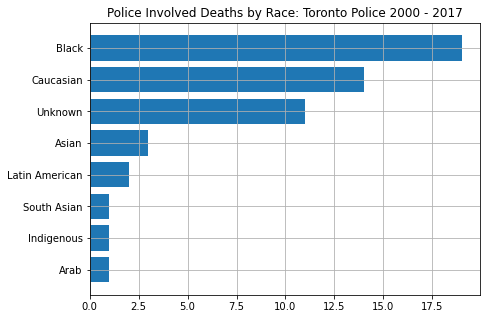

In [20]:
PID_Toronto = PID_Canada.loc[PID_Canada['Department']=='Toronto Police Service'].copy()

Toronto_by_Race = PID_Toronto.groupby('race').count()['id_victim'].sort_values()
plt.figure(figsize=(7,5))
plt.barh(Toronto_by_Race.index,Toronto_by_Race)
plt.grid()
plt.title('Police Involved Deaths by Race: Toronto Police 2000 - 2017')

## Importing a shapefile

This data was obtained using [Simply Analytics](https://resources.library.ubc.ca/page.php?id=1044).  This site is available to access for any UBC student.
* Folium needs the data in a different format, known a as a geojson file.  We can convert the file with geopandas after doing some calculations.

In [21]:
# the .read_file() function reads shapefiles
Toronto_CT = gpd.read_file('Data/CensusTracts/SimplyAnalytics_Shapefiles_2021-08-05_06_05_52_5967ef485df912237a11768414ffc831.shp')
print(Toronto_CT.crs)

## Note - This is the terminology used by the census
## It can be found in the variable_name file that comes with the download
Toronto_CT = Toronto_CT.rename(columns={
'VALUE0': 'Aboriginal Identity, 2020',
'VALUE1': 'Total Population, 2020',
'VALUE2': 'Visible Minority Black, 2020',
'VALUE3': 'Visible Minority Total, 2020'
})

Toronto_CT['Non-White'] = Toronto_CT[['Aboriginal Identity, 2020','Visible Minority Total, 2020']].sum(axis=1)#/Toronto_CT['Population, 2016']*100

Toronto_CT['NonWhitePCT'] = (Toronto_CT['Non-White']/Toronto_CT['Total Population, 2020']*100).round(0)

Toronto_CT['BlackPCT'] = (Toronto_CT['Visible Minority Black, 2020']/Toronto_CT['Total Population, 2020']*100).round(0)

Toronto_CT=Toronto_CT.fillna(0)
# .to_crs()changes the coordinate system
# Provincial_Data = Provincial_Data.to_crs('EPSG:4326')
# .to_file() saves our data to the specified format
print('Data Converted')
Toronto_CT.to_file("Data/Toronto_CT.json", driver = "GeoJSON")
Toronto_CT.head()

epsg:4326
Data Converted


,spatial_id,name,"Aboriginal Identity, 2020","Total Population, 2020","Visible Minority Black, 2020","Visible Minority Total, 2020",geometry,Non-White,NonWhitePCT,BlackPCT
0,5350001.00,"CT0001.00, Toronto, ON",10.0,604.0,12.0,217.0,"POLYGON ((-79.30312 43.65578, -79.30457 43.654...",227.0,38.0,2.0
1,5350002.00,"CT0002.00, Toronto, ON",6.0,636.0,0.0,0.0,"POLYGON ((-79.34875 43.63006, -79.34450 43.613...",6.0,1.0,0.0
2,5350003.00,"CT0003.00, Toronto, ON",14.0,949.0,52.0,193.0,"POLYGON ((-79.43443 43.63363, -79.43365 43.633...",207.0,22.0,5.0
3,5350004.00,"CT0004.00, Toronto, ON",180.0,7139.0,738.0,3786.0,"POLYGON ((-79.43603 43.63717, -79.43538 43.635...",3966.0,56.0,10.0
4,5350005.00,"CT0005.00, Toronto, ON",150.0,7566.0,870.0,3702.0,"POLYGON ((-79.42458 43.64105, -79.42383 43.640...",3852.0,51.0,11.0


## Make a Choropleth map centered on Toronto, showing the point data draped over it

Foium's [Choropleth](https://python-visualization.github.io/folium/quickstart.html#Choropleth-maps) allows us to quickly display color-coded polygons.


In [24]:
Toronto_coords = geolocator.geocode('Downtown Toronto, Ontario')
Toronto_Map = folium.Map(
    location=[Toronto_coords.latitude,Toronto_coords.longitude],
    zoom_start=10,
    tiles='Stamen Toner'
)


# The .features.Chloropleth() function allows us to classify our data
# We give function the location of our GeoJSON file

folium.features.Choropleth('Data/Toronto_CT.json',
                           # It will match the geometry data up with a pandas or geopandas dataframe
                            data=Toronto_CT,
                            columns=['spatial_id','BlackPCT'],
                           # They key in the GeoJSON file to match by
                            key_on='feature.properties.spatial_id',
                           # If we define bins, it will split where we tell it to
                            bins = [0,10,20,55],
                            fill_color='YlOrRd',
                            fill_opacity = 1,
                            smooth=2,
                           # The layer name
                            name='Black Population %',
                           # The legend label
                            legend_name='Black Population %',
                           # Whether it shows up by default or must be turned on with the legend
                            show=True
                          ).add_to(Toronto_Map)


group = folium.FeatureGroup(name='Deaths')
for index, row in PID_Toronto.iterrows():
    # if the geocoding didn't fail, we'll plot the point, colored by the province
    if row['geocoding_Notes'] != 'Geocoding Failed':
#         print(row['race'], row['gender'],str(row['age']))
        plot_point(Map=group,
                   X=row['latitude'],
                   Y=row['longitude'],
                   Popup_Text=row['race']+' '+ row['gender'] + ' '+ str(row['age'])\
                     + ' '+ row['city_town'] + ' '+ row['prov']+ ' '+ row['postal_code'],
                   Color='blue'#color_Scheme[row['prov']]
                  )#.add_to(Toronto_Map)

group.add_to(Toronto_Map)

folium.LayerControl().add_to(Toronto_Map)
Toronto_Map

## Enhanced functionality

Folim also allows for more advanced functionality, including dynamic text, using the (GeoJson)[https://python-visualization.github.io/folium/quickstart.html#GeoJSON/TopoJSON-Overlays] function.

In [36]:
Toronto_coords = geolocator.geocode('Downtonw Toronto, Ontario')
Toronto_Map = folium.Map(
    location=[Toronto_coords.latitude,Toronto_coords.longitude],
    zoom_start=10,
    tiles='Stamen Toner'
)

# colormap = cm.linear.PuRd_05.scale(Toronto_CT['Total Population, 2020'].min(), Toronto_CT['Total Population, 2020'].max())
colormap = cm.LinearColormap(['#f5f8fa','#0f91f5'],
                             vmin=Toronto_CT['BlackPCT'].min(),
                             vmax=Toronto_CT['BlackPCT'].max())
colormap = colormap.to_step(n=4)#
colormap.caption = 'Black Population  %'
colormap.add_to(Toronto_Map)

folium.GeoJson(
    'Data/Toronto_CT.json',
    name='NonWhitePCT',
    smooth_factor=1.75,
    style_function = lambda x:{'color':'black',
                               "weight": 1,
                               "fillOpacity": 1,
                              'fillColor':colormap(x['properties']['BlackPCT'])
                              },
    tooltip=folium.features.GeoJsonTooltip(fields=['Total Population, 2020',
                                                   'Visible Minority Black, 2020',
                                                   'Aboriginal Identity, 2020',
                                                   'BlackPCT',
                                                   'NonWhitePCT'],
                                           aliases=['Total Population, 2020',
                                                    'Black, 2020',
                                                    'Indigineous, 2020',
                                                    'Black Population %',
                                                    'Non-White %']
                                          ),
    show = True
).add_to(Toronto_Map)



group = folium.FeatureGroup(name='Deaths')
for index, row in PID_Canada.iterrows():
    # if the geocoding didn't fail, we'll plot the point, colored by the province
    if row['geocoding_Notes'] != 'Geocoding Failed':
#         print(row['race'], row['gender'],str(row['age']))
        plot_point(Map=group,
                   X=row['latitude'],
                   Y=row['longitude'],
                   Popup_Text=row['race']+' '+ row['gender'] + ' '+ str(row['age'])\
                     + ' '+ row['city_town'] + ' '+ row['prov']+ ' '+ row['postal_code'],
                   Color='red'#color_Scheme[row['prov']]
                  )

group.add_to(Toronto_Map)

folium.LayerControl().add_to(Toronto_Map)
Toronto_Map

## Exporting the map

In [37]:
Toronto_Map.save('PID_Toronto.html')
print('Map Saved!')

Map Saved!
